## Parte 1 (imágenes en /white_patch y /coord_cromaticas):
1. Implementar el algoritmo de pasaje a coordenadas cromáticas para librarnos de las variaciones de contraste.
2. Implementar el algoritmo White Patch para librarnos de las diferencias de color de iluminación.
3. Mostrar los resultados obtenidos y analizar las posibles fallas (si es que las hay) en el caso de White patch.

In [1]:
# Importamos librerias
import numpy as np
import cv2 as cv
import matplotlib.pyplot as plt

Cromaticas

In [2]:
# cargamos primera imagen
img_cro1 = cv.imread('./coord_cromaticas/CoordCrom_1.png')
img_cro2 = cv.imread('./coord_cromaticas/CoordCrom_2.png')
img_cro3 = cv.imread('./coord_cromaticas/CoordCrom_3.png')
print(f"Tamaño de la primera imagen: {img_cro1.shape}")
print(f"Tamaño de la segunda imagen: {img_cro2.shape}")
print(f"Tamaño de la tercera imagen: {img_cro3.shape}")

Tamaño de la primera imagen: (996, 908, 3)
Tamaño de la segunda imagen: (996, 908, 3)
Tamaño de la tercera imagen: (996, 908, 3)


In [3]:
# funcion para imprimir imagenes
def show_images(img: list, row: int, col: int):
    figure = plt.figure(figsize=(18,18))
    for i in range(len(img)):
        figure.add_subplot(row,col,i+1)
        plt.imshow(img[i])
        figure.tight_layout(pad=1)   
    plt.show

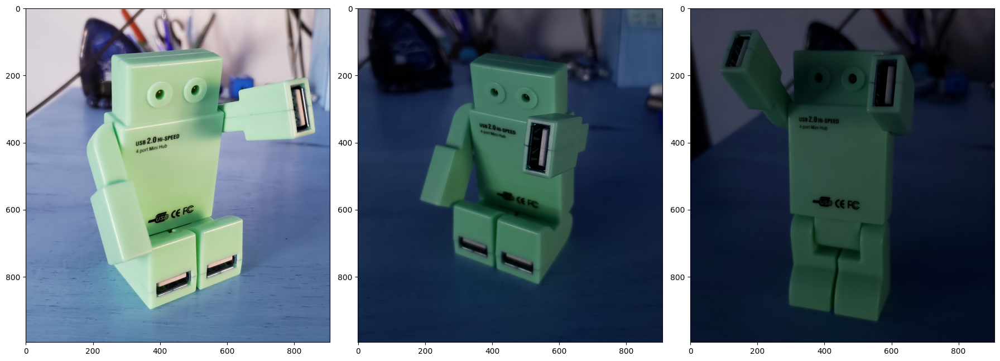

In [4]:
# Imagen original con problemas de color
images = [img_cro1, img_cro2, img_cro3]
show_images(images, 1,3)

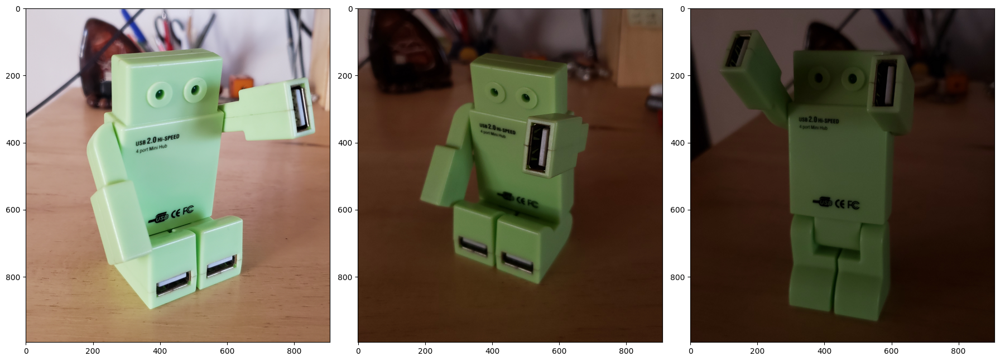

In [5]:
# pasar a RGB para ver el color original en este caso
imgRGB_cro1 = cv.cvtColor(img_cro1, cv.COLOR_BGR2RGB)
imgRGB_cro2 = cv.cvtColor(img_cro2, cv.COLOR_BGR2RGB)
imgRGB_cro3 = cv.cvtColor(img_cro3, cv.COLOR_BGR2RGB)

# mostramos imagenes
images = [imgRGB_cro1, imgRGB_cro2, imgRGB_cro3]
show_images(images, 1, 3)

In [6]:
# funcion para pasar a cromaticas
def cromaticas(img):

    # Separamos canales 
    channel_r, channel_g, channel_b = cv.split(img)

    # sumamos los canales y multiplicamos por un escalar para balancear los colores
    sum_channels =   channel_r + 0.82* channel_g +  0.07* channel_b

    # aplicamos coordenadas cromaticas
    new_channel_r = np.where(sum_channels != 0, channel_r/(sum_channels), 0)  
    new_channel_g = np.where(sum_channels != 0, channel_g/(sum_channels), 0)  
    new_channel_b = np.where(sum_channels != 0, channel_b/(sum_channels), 0) 

    # unimos todos los canales y normalizamos
    img_mod = cv.merge((new_channel_r,new_channel_g,new_channel_b)) * 255.0

    # Convertir tipos de datos
    img_mod = img_mod.astype(img.dtype)

    return img_mod

/var/folders/th/f02nw4xd4xg6c6tc6mn55h800000gn/T/ipykernel_15880/2415600762.py:11: RuntimeWarning: invalid value encountered in divide
  new_channel_r = np.where(sum_channels != 0, channel_r/(sum_channels), 0)
/var/folders/th/f02nw4xd4xg6c6tc6mn55h800000gn/T/ipykernel_15880/2415600762.py:12: RuntimeWarning: invalid value encountered in divide
  new_channel_g = np.where(sum_channels != 0, channel_g/(sum_channels), 0)
/var/folders/th/f02nw4xd4xg6c6tc6mn55h800000gn/T/ipykernel_15880/2415600762.py:13: RuntimeWarning: invalid value encountered in divide
  new_channel_b = np.where(sum_channels != 0, channel_b/(sum_channels), 0)


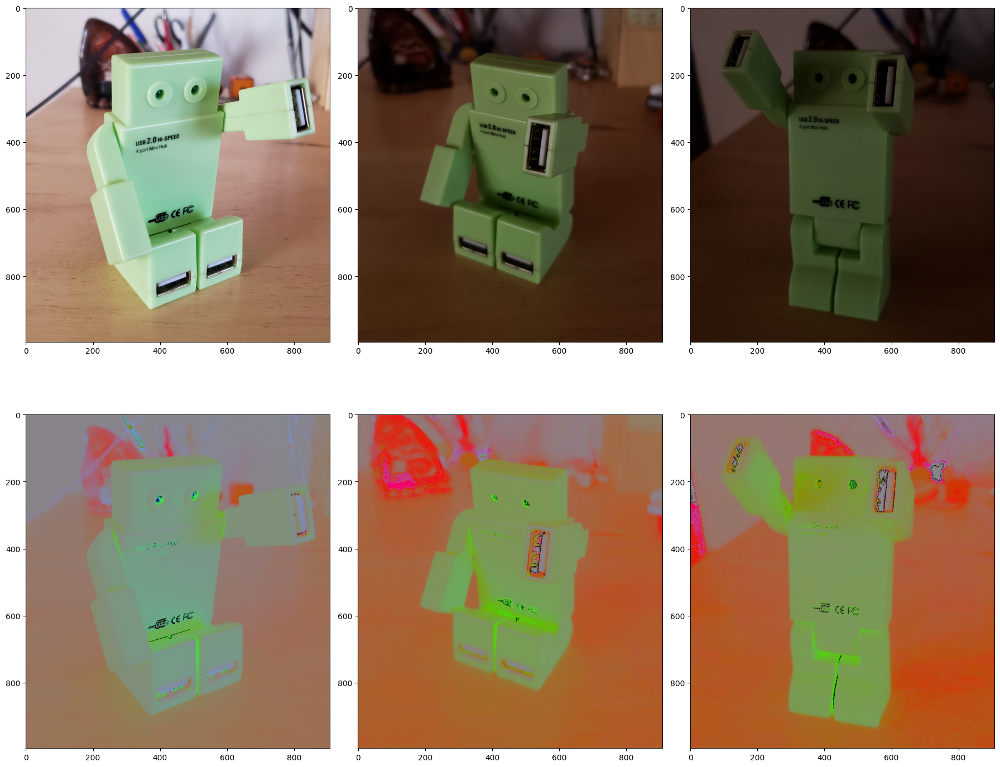

In [7]:
img_cro_1 = cromaticas(imgRGB_cro1)
img_cro_2 = cromaticas(imgRGB_cro2)
img_cro_3 = cromaticas(imgRGB_cro3)

# mostramos imagenes originales vs imagenes cromaticas
images = [imgRGB_cro1, imgRGB_cro2, imgRGB_cro3, img_cro_1, img_cro_2, img_cro_3]
show_images(images,2,3)

In [8]:
# contraste original
c_original_img1 = (np.max(imgRGB_cro1) - np.min(imgRGB_cro1))
c_original_img2 = (np.max(imgRGB_cro2) - np.min(imgRGB_cro2))
c_original_img3 = (np.max(imgRGB_cro3) - np.min(imgRGB_cro3))

# nuevo contraste
c_new_img1 = (np.max(img_cro_1) - np.min(img_cro_1))
c_new_img2 = (np.max(img_cro_2) - np.min(img_cro_2))
c_new_img3 = (np.max(img_cro_3) - np.min(img_cro_3))

print(f"Contraste original imagen 1: {c_original_img1}")
print(f"Contraste original imagen 2: {c_original_img2}")
print(f"Contraste original imagen 3: {c_original_img3}")
print(f"Contraste nuevo imagen 1: {c_new_img1}")
print(f"Contraste nuevo imagen 2: {c_new_img2}")
print(f"Contraste nuevo imagen 3: {c_new_img3}")

Contraste original imagen 1: 255
Contraste original imagen 2: 195
Contraste original imagen 3: 146
Contraste nuevo imagen 1: 255
Contraste nuevo imagen 2: 255
Contraste nuevo imagen 3: 255


**Analisis para coordenadas cromaticas:**

Al aplicar la funcion cromatica para convertir nuestra imagen RGB a coordenadas cromaticas. Se obtuvo un buen resultado en general, ya que, se disminuyo lo más prosible la variacion del contraste entre las imagenes. Sin embargo, se ve que la iluminacion que trae la imagen original sigue afectando a la imagen de salida. 

White Patch

In [9]:
# cargamos imagenes
img_hands_b = cv.imread('./white_patch/test_blue.png')
img_hands_g = cv.imread('./white_patch/test_green.png')
img_hands_r = cv.imread('./white_patch/test_red.png')
img_fig_r2 = cv.imread('./white_patch/wp_red.png')
img_fig_r = cv.imread('./white_patch/wp_red.png')
img_fig_b = cv.imread('./white_patch/wp_blue.jpg')
img_fig_g = cv.imread('./white_patch/wp_green.png')
img_fig_g2 = cv.imread('./white_patch/wp_green2.jpg')

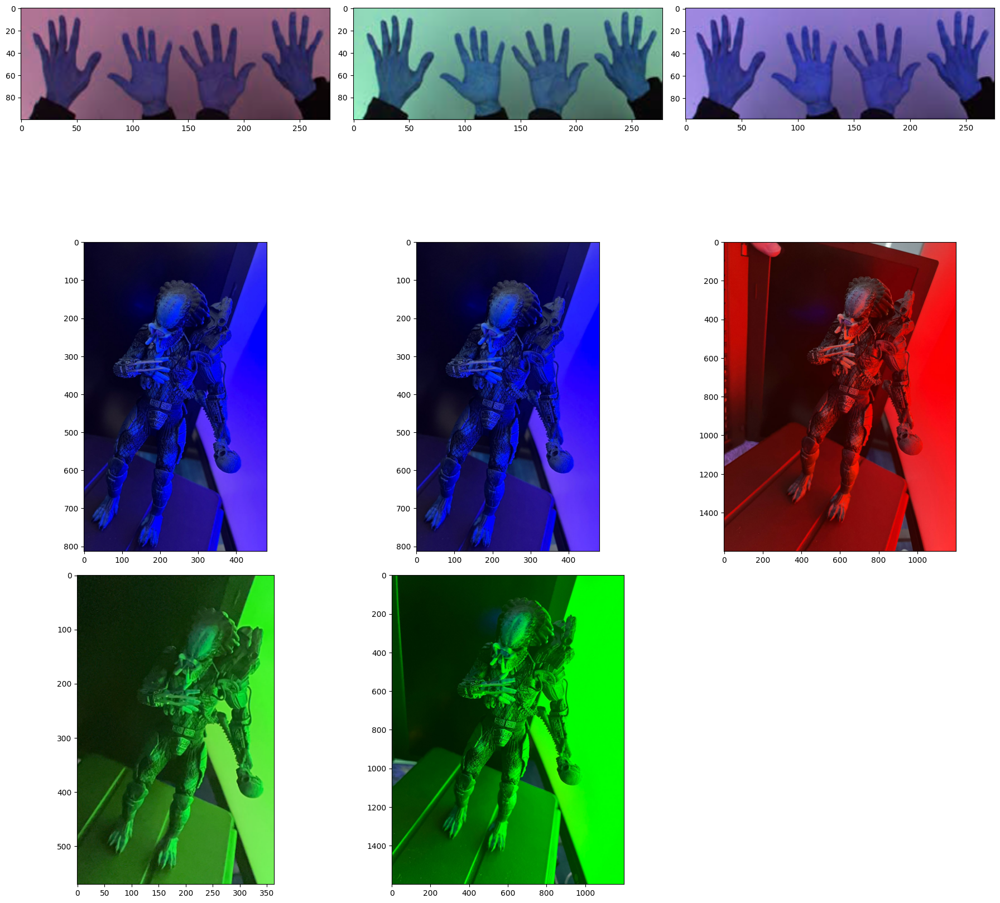

In [10]:
# mostramos imagenes originales
images = [img_hands_b, img_hands_g, img_hands_r, img_fig_r2, img_fig_r, img_fig_b,img_fig_g,img_fig_g2 ]
show_images(images,3,3)

In [11]:
# corregimos error al cargar las imagenes
img_hands_b_rgb = cv.cvtColor(img_hands_b, cv.COLOR_BGR2RGB)
img_hands_g_rgb = cv.cvtColor(img_hands_g, cv.COLOR_BGR2RGB)
img_hands_r_rgb = cv.cvtColor(img_hands_r, cv.COLOR_BGR2RGB)
img_fig_r2_rgb = cv.cvtColor(img_fig_r2, cv.COLOR_BGR2RGB)
img_fig_r_rgb = cv.cvtColor(img_fig_r, cv.COLOR_BGR2RGB)
img_fig_b_rgb = cv.cvtColor(img_fig_b, cv.COLOR_BGR2RGB)
img_fig_g_rgb = cv.cvtColor(img_fig_g, cv.COLOR_BGR2RGB)
img_fig_g2_rgb = cv.cvtColor(img_fig_g2, cv.COLOR_BGR2RGB)

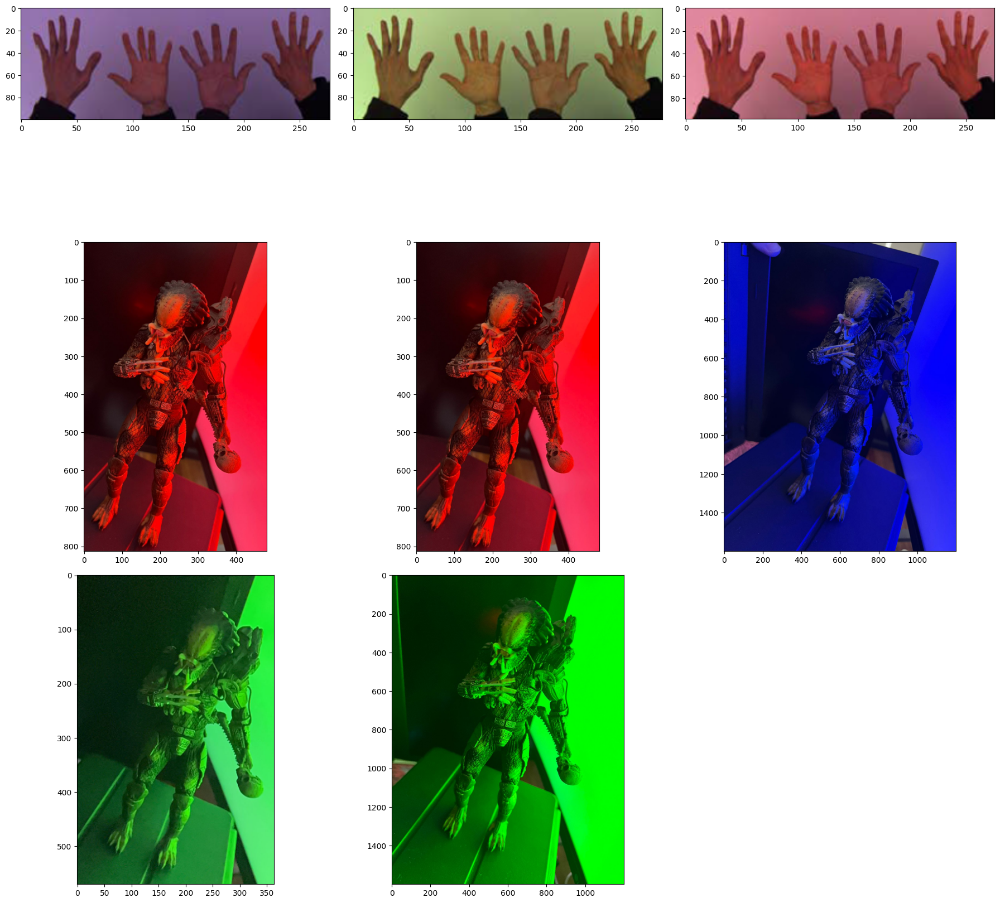

In [12]:
# mostramos imagenes corregidas
images = [img_hands_b_rgb, img_hands_g_rgb, img_hands_r_rgb, img_fig_r2_rgb, img_fig_r_rgb, 
          img_fig_b_rgb,img_fig_g_rgb,img_fig_g2_rgb ]
show_images(images, 3,3)

In [13]:
# funcion para hacer white patch
def white_patch(img):
    # separamos los canales
    channel_r, channel_g, channel_b = cv.split(img)

    # sacamos el valor maximo de cada canal
    channel_r_max = np.max(channel_r)
    channel_g_max = np.max(channel_g)
    channel_b_max = np.max(channel_b)

    # percentil canal rojo
    pix_r = np.ravel(channel_r)
    pix_sort_r = np.sort(pix_r)

    idx_percentil_90_r = int(len(pix_sort_r) * 0.9)

    percentil_90_r = pix_sort_r[idx_percentil_90_r]

    # percentil canal verde
    pix_g = np.ravel(channel_g)
    pix_sort_g = np.sort(pix_g)

    idx_percentil_90_g = int(len(pix_sort_g) * 0.9)

    percentil_90_g = pix_sort_g[idx_percentil_90_g]
    
    # percentil canal azul
    pix_b = np.ravel(channel_b)
    pix_sort_b = np.sort(pix_b)

    idx_percentil_90_b = int(len(pix_sort_b) * 0.9)

    percentil_90_b = pix_sort_r[idx_percentil_90_b]

    #escalamos
    scale_r = 255.0 / channel_r_max 
    scale_g = 255.0 / channel_g_max
    scale_b = 255.0 / channel_b_max

    # hacemos wp algoritmo
    new_channel_r = np.where(channel_r_max != 255,  np.clip(channel_r * scale_r,0,255), np.clip(channel_r* (255.0/percentil_90_r),0,255)) 
    new_channel_g = np.where(channel_g_max != 255,  np.clip(channel_g * scale_g,0,255), np.clip(channel_g* (255.0/percentil_90_g),0,255))
    new_channel_b = np.where(channel_b_max != 255,  np.clip(channel_b * scale_b,0,255), np.clip(channel_b* (255.0/percentil_90_b),0,255))

    # unimos los canales
    img_mod = cv.merge((new_channel_r, new_channel_g, new_channel_b))

    # unidades originales
    img_mod = img_mod.astype(img.dtype)

    return img_mod

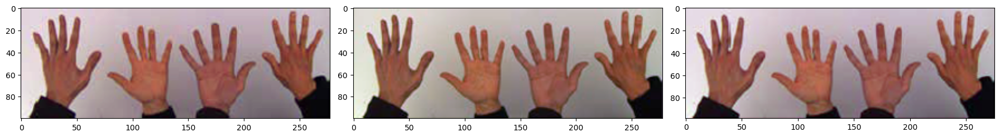

In [14]:
img_hands_b_wp = white_patch(img_hands_b_rgb)
img_hands_g_wp = white_patch(img_hands_g_rgb)
img_hands_r_wp = white_patch(img_hands_r_rgb)

images = [img_hands_b_wp, img_hands_g_wp, img_hands_r_wp]
show_images(images, 1,3)

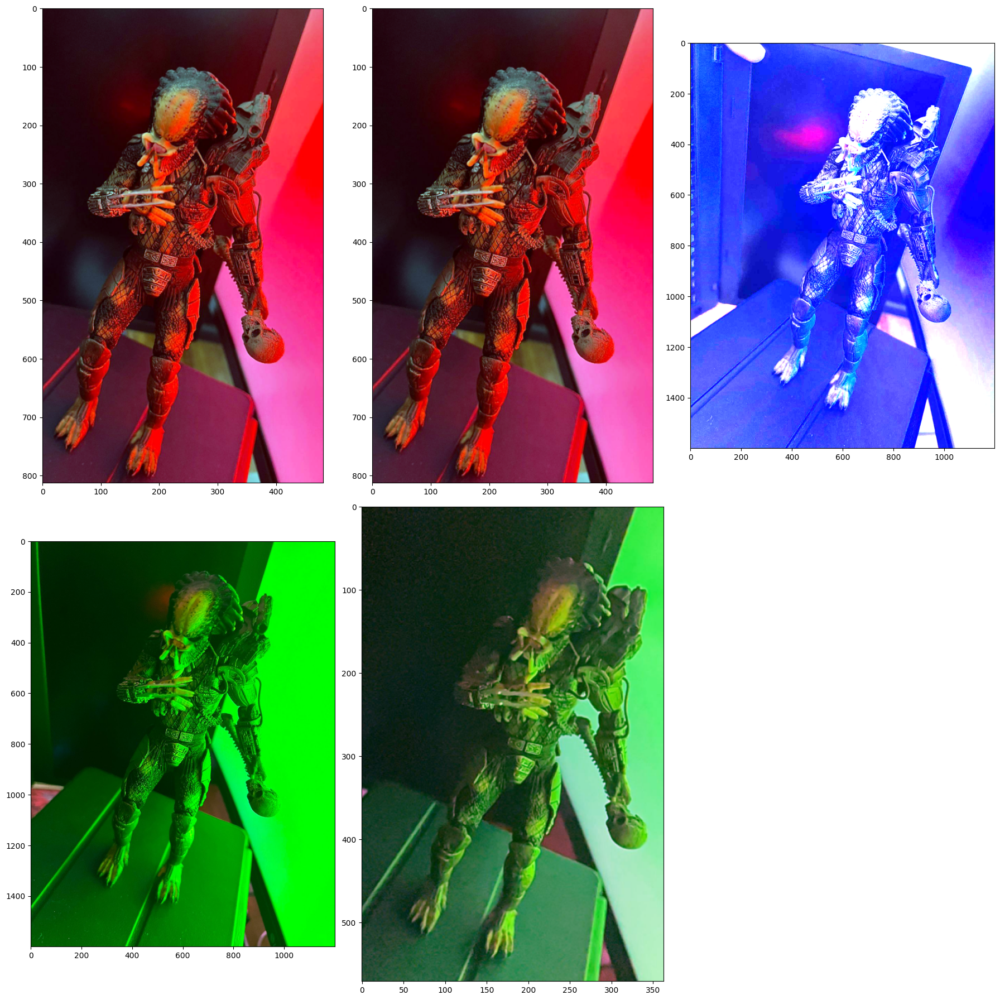

In [15]:
img_fig_r2_wp = white_patch(img_fig_r2_rgb)
img_fig_r_wp = white_patch(img_fig_r_rgb)
img_fig_b_wp = white_patch(img_fig_b_rgb)
img_fig_g2_wp = white_patch(img_fig_g2_rgb)
img_fig_g_wp = white_patch(img_fig_g_rgb)


images = [img_fig_r2_wp, img_fig_r_wp, img_fig_b_wp, img_fig_g2_wp, img_fig_g_wp]
show_images(images,2,3)

**Analisis White Patch:**

Despues de implementar el algoritmo de White Patch se puede notar una mejora en las imagenes de salida. 

* **Imagenes de manos:**
Para las imagenes de manos se nota una clara diferencia entre la imagen original y la imagen procesada con White Patch. Primero el color de fondo desaparecio para ser ahora un color mas blanco y en consecuencia la percepcion que ahora se tiene de las imagenes es distinta. Con esto, ahora es posible percibir las 3 imagenes como si fueran casi iguales.

* **Imagenes de Alien:**
En las imagenes del alien se puede notar una mejora en algunos casos.

  * La imagen de alien con iluminacion roja ahora se puede percibir mejor el color original de la figura ,ya que, el color de la iluminacion ya no lo afecta tanto como se podia observar en la imagen original. Esto aplica para ambas imagenes rojas que tienen distintos acercamientos. 

  * Para el caso de la figura iluminada con la luz verde, a pesar que se nota una mejora aún la sigue afectando en gran medida el color de la iluminacion.

  * Para la figura iluminada con luz azul no se notan mejoras. De hecho parece que la imagen empeora con respecto a la imagen original, ya que, la misma se puede percibir con mucha saturación y además se nota la aparicion del color rojo. Esto se puede deber a que la imagen original es realmente oscura y al aplicar el White Patch creamos el efecto contrario. Tambien podría deberse a un mal ajuste de los valores de los canales de color durante la ejecucion del algoritmo.



## Parte 2:
1. Para las imágenes img1_tp.png y img2_tp.png leerlas con OpenCV en escala de grisas y visualizarlas. 
2. Elija el numero de bins que crea conveniente y grafique su histograma, compare los histogramas entre si. 
Explicar lo que se observa, si tuviera que entrenar un modelo de clasificación/detección de imágenes, 
considera que puede ser de utilidad tomar como ‘features’ a los histogramas?
3. Para la imagen segmentacion.png analice el histograma de los canales RGB. Segmente algunos de los 
elementos presentes en la imagen (agua, cielo, tierra) y muestre, aplicando mascaras, las regiones en imágenes 
separadas.

In [16]:
# leemos las imagenes en escala de grises
img_gray1 = cv.imread("./img1_tp.png", cv.IMREAD_GRAYSCALE)
img_gray2 = cv.imread("./img2_tp.png", cv.IMREAD_GRAYSCALE)

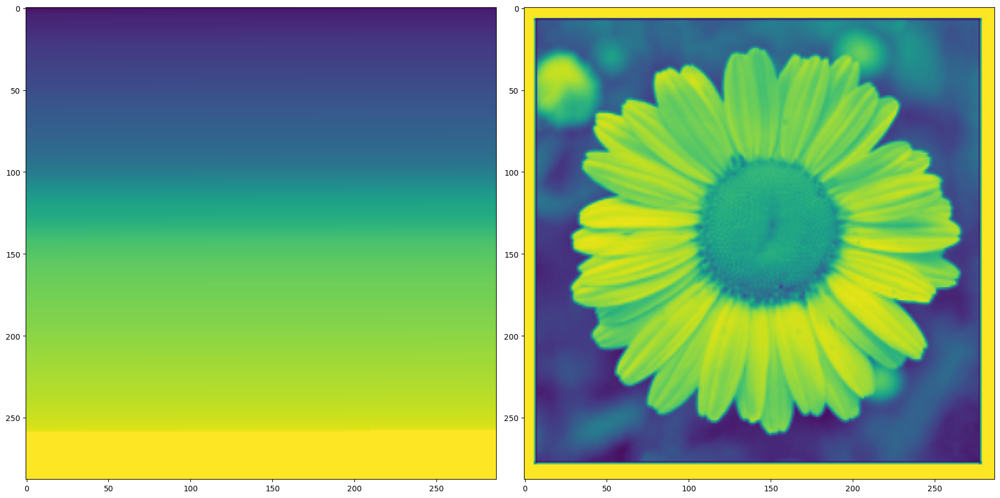

In [17]:
images = [img_gray1, img_gray2]
show_images(images, 1,2)

<function matplotlib.pyplot.show(close=None, block=None)>

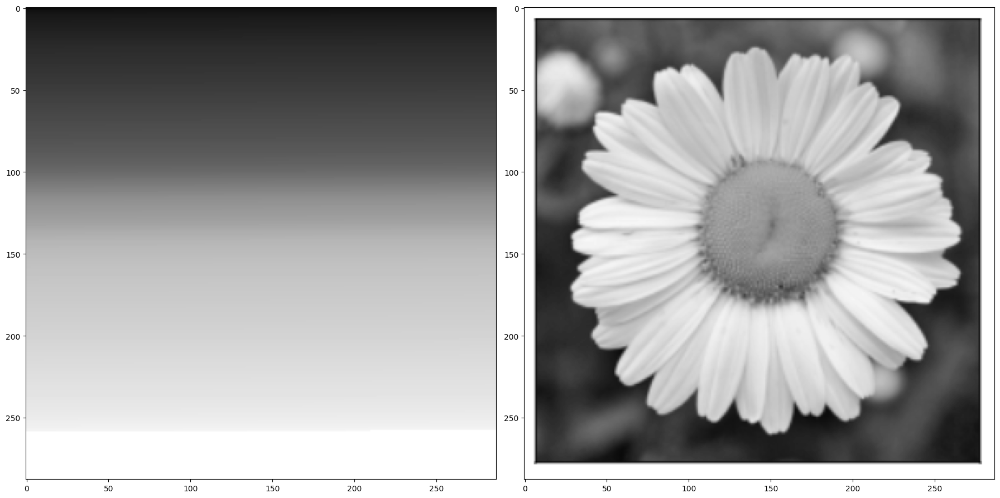

In [18]:
# ajustamos el color map
figure = plt.figure(figsize=(18,18))
for i in range(len(images)):
    figure.add_subplot(1,2,i+1)
    plt.imshow(images[i], cmap='gray')
    figure.tight_layout(pad=1)   
plt.show

Text(0.5, 1.0, 'image gray 2 (flower)')

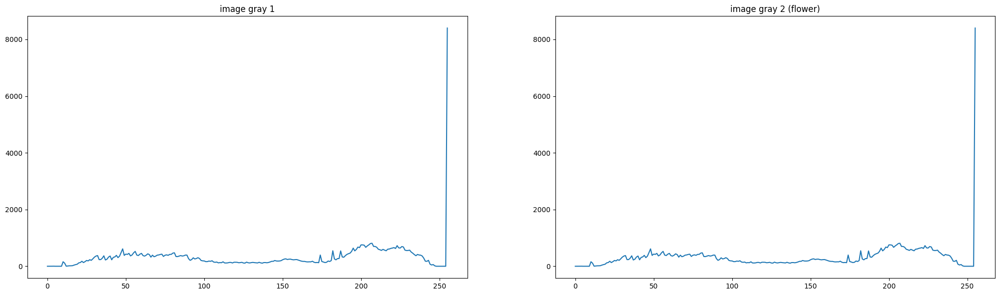

In [19]:
# sacamos los histogramas
figure = plt.figure(figsize=(25,15))

hist1, bins1 = np.histogram(img_gray1.ravel(),bins=256, range=[0,255])
ax1 = plt.subplot(221)
ax1.plot(hist1)
plt.title('image gray 1')

hist2, bins2 = np.histogram(img_gray2.ravel(),bins=256, range=[0,255])
ax2 = plt.subplot(222)
ax2.plot(hist2)
plt.title('image gray 2 (flower)')

Como se puede observar ambos histogramas son muy parecidos para las dos imagenes que se presentaron anteriormente.

Primero se puede notar que se tiene una gran cantidad de pixeles saturados ya que ambos histogramas muestran que el pixel 255 es el que tiene mayor cantidad de ocurrencia, es decir, en nuestras imagenes tenemos muchos pixeles con el valor de 255.

Por otro lado, el histograma en este caso no nos servirian para un problema de clasicacion ya que ambas imagenes tienen distribuciones muy parecidas. Sin embargo, los histogramas en general pueden captar caracteristicas importantes de una imagen como lo observamos en este ejercicio donde notamos la intensidad de los pixeles. De esta forma, es posible utilizarlos como features en algunos problemas de clasificación donde el algoritmo pueda diferenciar entre clases basado en patrones que encuentre los histogramas.

<function matplotlib.pyplot.plot(*args: 'float | ArrayLike | str', scalex: 'bool' = True, scaley: 'bool' = True, data=None, **kwargs) -> 'list[Line2D]'>

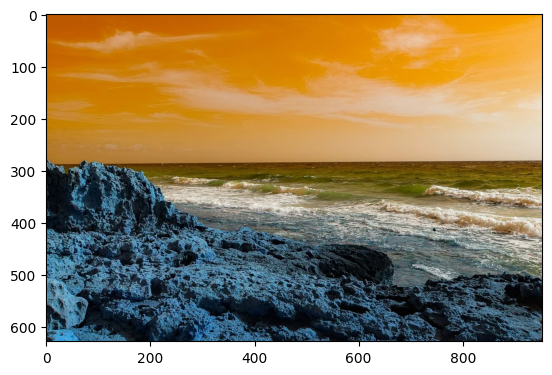

In [20]:
# segmentacion
img_seg = cv.imread('./segmentacion.png')
plt.imshow(img_seg)
plt.plot

<function matplotlib.pyplot.plot(*args: 'float | ArrayLike | str', scalex: 'bool' = True, scaley: 'bool' = True, data=None, **kwargs) -> 'list[Line2D]'>

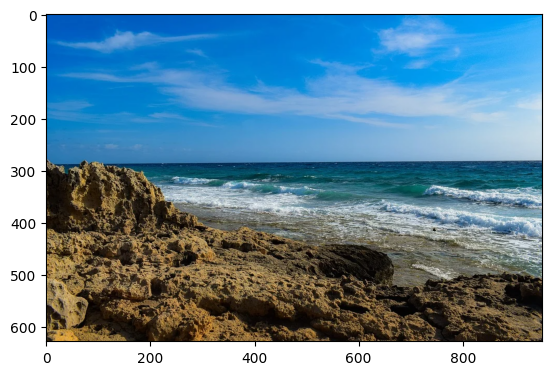

In [21]:
# arreglamos colores 
img_seg_rgb = cv.cvtColor(img_seg, cv.COLOR_BGR2RGB)
plt.imshow(img_seg_rgb)
plt.plot

Text(0.5, 1.0, 'Canales RGB')

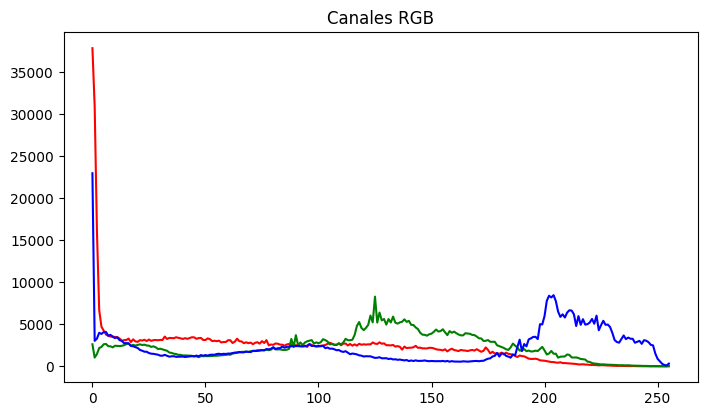

In [22]:
# separamos los canales RGB
channel_r, channel_g, channel_b = cv.split(img_seg_rgb)

# sacamos los histogramas
figure = plt.figure(figsize=(18,10))

hist_r, bins_r = np.histogram(channel_r.ravel(),bins=256, range=[0,255])
ax1 = plt.subplot(221)
ax1.plot(hist_r, color='r')

hist_g, bins_g = np.histogram(channel_g.ravel(),bins=256, range=[0,255])
ax2 = plt.subplot(221)
ax2.plot(hist_g, color='g')

hist_b, bins_b = np.histogram(channel_b.ravel(),bins=256, range=[0,255])
ax3 = plt.subplot(221)
ax3.plot(hist_b, color='b')
plt.title('Canales RGB')

Text(0.5, 1.0, 'Canal Azul')

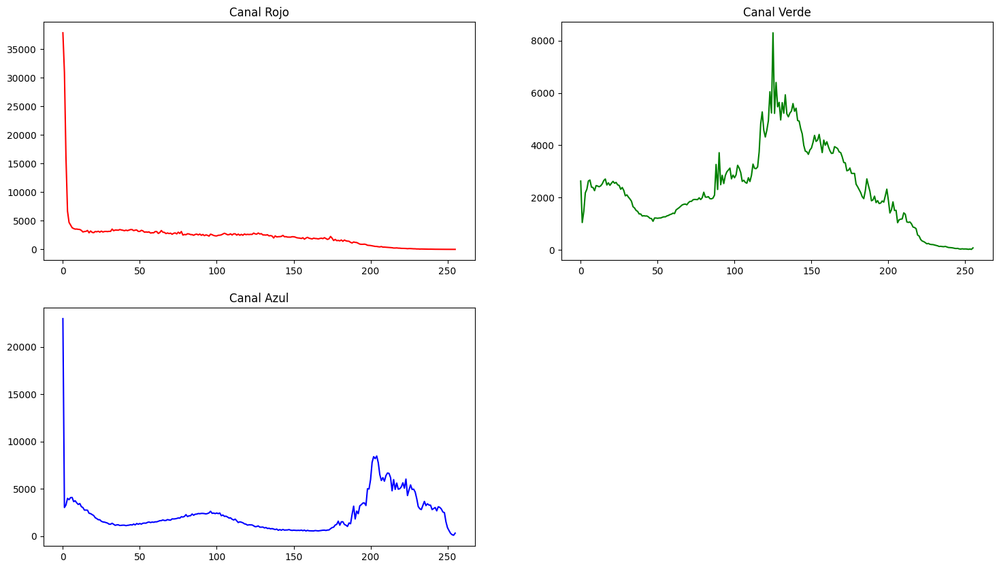

In [23]:
# sacamos los histogramas separados
figure = plt.figure(figsize=(18,10))

hist_r, bins_r = np.histogram(channel_r.ravel(),bins=256, range=[0,255])
ax1 = plt.subplot(221)
ax1.plot(hist_r, color='r')
plt.title('Canal Rojo')

hist_g, bins_g = np.histogram(channel_g.ravel(),bins=256, range=[0,255])
ax2 = plt.subplot(222)
ax2.plot(hist_g, color='g')
plt.title('Canal Verde')

hist_b, bins_b = np.histogram(channel_b.ravel(),bins=256, range=[0,255])
ax3 = plt.subplot(223)
ax3.plot(hist_b, color='b')
plt.title('Canal Azul')

**Analisis de histogramas**

La distribucion del color verde podría ser gaussiana. Mientras que la distribucion del color rojo y azul podrían ser logaritmica. Por otro lado, convendría hacer la segmentacion por HSV

In [24]:
#import PyQt6.QtCore
#%matplotlib qt

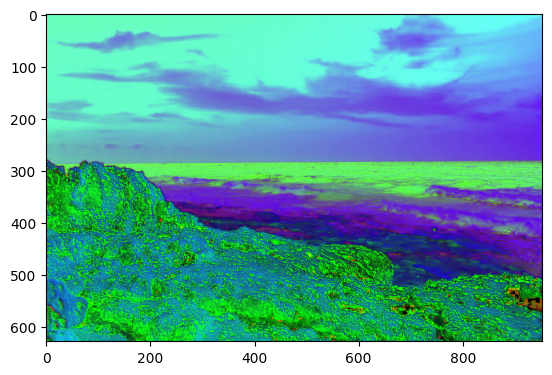

In [25]:
# pasamos a HSV para hacer la segmentacion
img_seg_hsv = cv.cvtColor(img_seg_rgb, cv.COLOR_RGB2HSV)
plt.imshow(img_seg_hsv)


Con HSV ahora podemos ver los distintos valores del hue para tomar como referencia para hacer la segmentación.

Según la imagen anterior (desbloqueando la imagen completa con %matplotlib qt) se puede notar los siguientes valores de hue:

* tierra: 19 a 21
* agua: 90 a 100
* cielo: 102 a 105

In [26]:
img_portion_hsv = img_seg_hsv[230:280,230:280,:]

color_mean = cv.mean(img_portion_hsv)
    
print(color_mean)

(102.76960000000001, 166.03, 192.1416, 0.0)


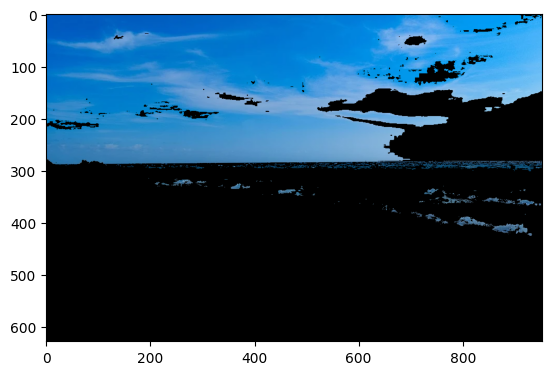

In [27]:
color_l = (color_mean[0]-2,100,100)
color_u = (color_mean[0]+3,255,255)

mask = cv.inRange(img_seg_hsv, color_l,  color_u)
img_segm = cv.bitwise_and(img_seg_rgb, img_seg_rgb, mask=mask)

plt.figure()
plt.imshow(img_segm)
plt.show()

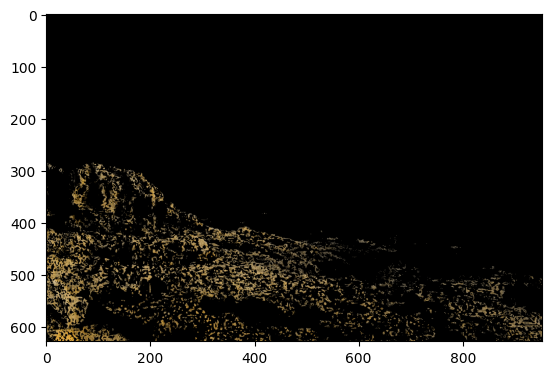

In [28]:
color_l_2 = (19,50,50)
color_u_2 = (21,255,255)

mask_2 = cv.inRange(img_seg_hsv, color_l_2,  color_u_2)
img_segm_2 = cv.bitwise_and(img_seg_rgb, img_seg_rgb, mask=mask_2)

plt.figure()
plt.imshow(img_segm_2)
plt.show()

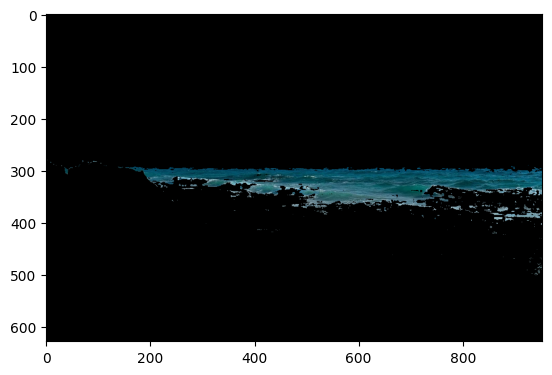

In [29]:
color_l_3 = (88,50,50)
color_u_3 = (99,255,255)

mask_3 = cv.inRange(img_seg_hsv, color_l_3,  color_u_3)
img_segm_3 = cv.bitwise_and(img_seg_rgb, img_seg_rgb, mask=mask_3)

plt.figure()
plt.imshow(img_segm_3)
plt.show()

Como se puede observar la segmentacion para el agua, tierra y el cielo salio bastante bien usando HSV.